# <font color='red'>MDI343 - Supervised anomaly detection</font>

In [1]:
# Data manip
from collections import Counter
import pandas as pd
import numpy as np
import random
# Vizu
import matplotlib.pyplot as plt
import seaborn as sns
import shap
sns.set_style("dark")

### ML

# Preprocessing and CV methods
from sklearn import preprocessing
from sklearn.model_selection import KFold, StratifiedKFold, RepeatedStratifiedKFold, GridSearchCV, train_test_split, cross_val_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.feature_selection import SelectFromModel

# First test algortihms
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, IsolationForest
from sklearn.svm import SVC, OneClassSVM

# Boosting methods
import xgboost as xgb
import lightgbm as lgb
import catboost as cbt

#Unbalanced libs
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from imblearn.ensemble import BalancedRandomForestClassifier 

# Metrics / AUC
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, auc, confusion_matrix, roc_curve, roc_auc_score, plot_roc_curve 

import warnings
warnings.filterwarnings("ignore")

In [2]:
### FUNCTIONS TO HELP IN RESULT VISUALISATIONs AND AUC SCORE ###

def perf_measure(y_true, y_pred):
    """
    function to compute 4 performance measure 
    return : precision, recall, accurancy, F1_score
    """
    CM = confusion_matrix(y_true, y_pred)
    TN = CM[0][0]
    FN = CM[1][0]
    TP = CM[1][1]
    FP = CM[0][1]
    precision = TP / (TP+FP)
    recall = TP / (TP+FN)
    accurancy = (TP+TN)/(TP+FN+TN+FP)
    F1_score = (2*precision*recall)/(precision+recall)
    print("Precision : {}\nRecall : {}\nAccurancy : {}\nF1 score : {}".format(precision, recall, accurancy, F1_score))
    return(precision, recall, accurancy, F1_score)

def plot_roc_conf(y_pred, y, title):
    """
    function to plot roc_curve
    """
    logit_roc_auc = roc_auc_score(y_pred, y)
    fpr, tpr, thresholds = roc_curve(y_pred, y)
    plt.figure(figsize=(20,10))
    plt.subplot(121)
    plt.plot(fpr, tpr, label='(area = %0.2f)' % logit_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for {}'.format(title))
    plt.legend(loc="lower right");
    return

def plot_roc_curve_folds(fold, classifier, X, Y, title):
    """
    function to plot roc curve with number of K-folds and depending on the classifier algorithm tested
    """
    #https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc_crossval.html#sphx-glr-auto-examples-model-selection-plot-roc-crossval-py
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)

    fig, ax = plt.subplots()
    plt.figure(figsize=(20,30))
    for i, (train, test) in enumerate(fold.split(X, Y)):
        classifier.fit(X[train], Y[train])
        viz = plot_roc_curve(classifier, X[test], Y[test],
                             name='ROC fold {}'.format(i),
                             alpha=0.3, lw=1, ax=ax)
        interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
    ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
            label='Chance', alpha=.8)
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(mean_fpr, mean_tpr, color='b',
            label=r'Mean ROC (AUC = %0.4f $\pm$ %0.4f)' % (mean_auc, std_auc),
            lw=2, alpha=.8)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                    label=r'$\pm$ 1 std. dev.')

    ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
           title="Receiver operating characteristic : {}".format(title))
    ax.legend(loc="lower right")
    plt.show()
    return

    
def plot_cm(labels, predictions, p=0.5):
    """
    function to plot confusion matrix
    """
    cm = confusion_matrix(labels, predictions > p)
    plt.figure(figsize=(5,5))
    sns.heatmap(cm, annot=True, fmt="d")
    plt.title('Confusion matrix @{:.2f}'.format(p))
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    print('Legitimate Transactions Detected (True Negatives): ', cm[0][0])
    print('Legitimate Transactions Incorrectly Detected (False Positives): ', cm[0][1])
    print('Fraudulent Transactions Missed (False Negatives): ', cm[1][0])
    print('Fraudulent Transactions Detected (True Positives): ', cm[1][1])
    print('Total Fraudulent Transactions: ', np.sum(cm[1]))
    return

1. [Take a look at the dataset](#Dataset)

2. [Feature exploration](#Features)

    [Pairplot](#Pairplot)
    
    [Scatter plot](#Scatter)
    
    [Distribution plots](#Distribution)
    
    [Violin plots](#Violin)
    
    [Analysis plot](#Analysis)
    
    [HeatMap](#HeatMap)
    
    [PCA](#PCA)

3. [ML model strategies](#ML)

    [First approch ML models classification](#Firstmodels)
    
    [Unbalanced](#Unbalanced)
    
    [Boosting methods](#BoostingGradient)
    
    [SHAP and SelectFromModel based on XGB](#Best)
    
    [Stacking](#Stacking)
    
    [Example of MLP](#MLP)

4. [Conclusion](#Conclusion)

[References](#References)

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

# 1. Take a look at the dataset <a name="Dataset"></a>

In [3]:
xtrain = pd.read_csv("data/valeo_xtrain.csv")
print(xtrain.shape)
xtest = pd.read_csv("data/valeo_xtest.csv")
print(xtest.shape)
ytrain = pd.read_csv("data/valeo_ytrain.csv")
print(ytrain.shape)

(27586, 27)
(27587, 27)
(27586, 1)


In [4]:
print("Is there NaN value in dataset ? : {}".format(bool(np.sum((xtrain.isna().sum() > 0).values))))

Is there NaN value in dataset ? : False


So we can see that we have 27 features for about 27000 observations. This means that we don't have big data scheduled observations, we have to be very carefull to not overfitt and maybe the question about using all of them and / or variables may be an important matter.

In [5]:
print(ytrain["Anomaly"].value_counts())
print(ytrain["Anomaly"].value_counts() / len(ytrain))
color_anomaly = ytrain.copy()
color_anomaly.replace([0, 1], ['blue', 'red'], inplace=True)
anomalies = ytrain.copy()
anomalies.replace([0, 1], ['Common', 'Anomaly'], inplace=True)

0    26893
1      693
Name: Anomaly, dtype: int64
0    0.974879
1    0.025121
Name: Anomaly, dtype: float64


In [6]:
# count examples in each class
counter = Counter(ytrain["Anomaly"])
# estimate scale_pos_weight value
scaler_weights = counter[0] / counter[1]
print('Estimate: %.3f' % round(scaler_weights))

Estimate: 39.000


In [7]:
xtrain_anomalies = xtrain.copy()
xtrain_anomalies["Anomaly"] = anomalies["Anomaly"]
xtrain_anomalies

,START2_OP020_V_1angle,START2_OP020_V_1torque,START2_OP020_V_2angle,START2_OP020_V_2torque,START2_OP040_Vision_cosseprog,START2_OP050_Vision_paliermodel,START2_OP050_Vision_palierpresencedouille,START2_OP060_Vision_tirantcouleur,START2_OP070_V_1angle,START2_OP070_V_1prog,...,START2_OP090_SnapRingMidPointForce,START2_OP090_SnapRingPeakForce,START2_OP090_StartLinePeakForce,START2_OP100_Capuchon_insertionmesure,START2_OP110_Vissage_M8angle,START2_OP110_Vissage_M8prog,START2_OP110_Vissage_M8torque,START2_OP120_RodageI_mesure,START2_OP120_RodageU_mesure,Anomaly
0,35.7,3.76,49.1,3.78,300.0,1.0,1.0,2.0,111.7,8.0,...,71.52,122.23,20.57,0.55,34.7,2.0,9.54,126.96,11.97,Common
1,47.2,3.77,50.3,3.76,30.0,1.0,1.0,2.0,106.0,8.0,...,67.38,163.78,18.73,0.55,38.7,2.0,9.54,133.88,11.97,Common
2,52.7,3.78,40.4,3.78,300.0,1.0,1.0,2.0,103.4,8.0,...,89.09,207.73,26.39,0.55,30.2,2.0,9.66,135.28,11.97,Common
3,34.9,3.77,34.9,3.78,1000.0,2.0,1.0,1.0,146.0,7.0,...,93.45,177.31,25.73,0.59,17.6,1.0,12.06,116.51,11.97,Common
4,50.0,3.77,41.9,3.75,400.0,1.0,1.0,2.0,115.8,8.0,...,85.17,174.73,21.50,0.42,52.0,1.0,12.12,140.92,11.98,Common
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27581,32.9,3.81,39.7,3.77,1000.0,2.0,1.0,1.0,129.4,7.0,...,116.56,201.69,64.99,0.60,18.5,1.0,12.21,122.47,11.97,Common
27582,35.9,3.81,36.5,3.79,1300.0,2.0,1.0,1.0,151.8,7.0,...,112.61,196.75,34.91,0.23,14.6,1.0,12.14,122.30,11.97,Common
27583,42.9,3.78,44.3,3.77,300.0,1.0,1.0,2.0,89.5,8.0,...,95.33,212.44,30.40,0.55,29.0,2.0,9.61,134.88,11.98,Common
27584,44.3,3.75,38.6,3.80,700.0,2.0,1.0,1.0,140.5,7.0,...,65.21,135.55,40.67,0.41,13.8,1.0,12.23,115.81,11.97,Common


I want to see the balance between my labeled observations and we clearly see that there is a big unbalanced -> about 1 for 39 !
I must be carefull in my used of classifier algorithms to consider this fact.

In [8]:
# normalise the train dataset
scaler = preprocessing.StandardScaler()
xtrain_norm = scaler.fit_transform(xtrain)
df_xtrain_norm = pd.DataFrame(xtrain_norm, columns=xtrain.columns.tolist())
print(df_xtrain_norm)
# normalise the test dataset
scalertest = preprocessing.StandardScaler()
xtest_norm = scalertest.fit_transform(xtest)
df_xtest_norm = pd.DataFrame(xtest_norm, columns=xtest.columns.tolist())
print(df_xtest_norm)

       START2_OP020_V_1angle  START2_OP020_V_1torque  START2_OP020_V_2angle  \
0                  -0.297744               -0.934470               1.381222   
1                   1.199678               -0.347533               1.566165   
2                   1.915837                0.239405               0.040386   
3                  -0.401913               -0.347533              -0.807270   
4                   1.564268               -0.347533               0.271564   
...                      ...                     ...                    ...   
27581              -0.662334                2.000218              -0.067498   
27582              -0.271702                2.000218              -0.560679   
27583               0.639772                0.239405               0.641450   
27584               0.822067               -1.521408              -0.237029   
27585               1.043425               -1.521408              -1.223391   

       START2_OP020_V_2torque  START2_OP040_Vision_

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

# 2. Feature exploration <a name="Features"></a>

**Separate labeled data**

In [9]:
xtrain_0 = xtrain.copy()
xtrain_1 = xtrain.copy()
ytrain_0 = ytrain[ytrain["Anomaly"] == 0].index.tolist()
ytrain_1 = ytrain[ytrain["Anomaly"] == 1].index.tolist()
xtrain_0.drop(index=ytrain_1, inplace=True)
xtrain_1.drop(index=ytrain_0, inplace=True)
xtrain_1

,START2_OP020_V_1angle,START2_OP020_V_1torque,START2_OP020_V_2angle,START2_OP020_V_2torque,START2_OP040_Vision_cosseprog,START2_OP050_Vision_paliermodel,START2_OP050_Vision_palierpresencedouille,START2_OP060_Vision_tirantcouleur,START2_OP070_V_1angle,START2_OP070_V_1prog,...,START2_OP090_SnapRingFinalStroke,START2_OP090_SnapRingMidPointForce,START2_OP090_SnapRingPeakForce,START2_OP090_StartLinePeakForce,START2_OP100_Capuchon_insertionmesure,START2_OP110_Vissage_M8angle,START2_OP110_Vissage_M8prog,START2_OP110_Vissage_M8torque,START2_OP120_RodageI_mesure,START2_OP120_RodageU_mesure
21,47.8,3.80,44.5,3.78,300.0,1.0,1.0,2.0,94.5,8.0,...,12.28,112.45,200.00,41.69,0.55,35.1,2.0,9.63,132.60,11.97
89,32.8,3.81,43.2,3.77,1300.0,2.0,1.0,1.0,141.5,7.0,...,11.74,93.46,196.96,26.02,0.23,15.9,1.0,12.19,118.16,11.97
127,32.7,3.75,34.9,3.77,1300.0,2.0,1.0,1.0,143.6,7.0,...,11.74,106.79,196.07,27.95,0.22,16.4,1.0,12.18,116.34,11.97
135,35.4,3.80,34.7,3.77,1300.0,2.0,1.0,1.0,160.7,7.0,...,11.74,89.36,181.35,31.50,0.23,12.6,1.0,12.18,129.29,11.97
165,41.0,3.75,36.8,3.79,300.0,1.0,1.0,2.0,104.5,8.0,...,11.83,111.02,175.80,40.42,0.54,29.3,2.0,9.55,142.64,11.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27427,29.1,3.77,40.1,3.78,1300.0,2.0,1.0,1.0,142.8,7.0,...,11.74,96.96,185.40,24.14,0.22,17.2,1.0,12.18,120.21,11.97
27445,34.1,3.79,36.3,3.77,1300.0,2.0,1.0,1.0,156.9,7.0,...,11.79,84.41,169.25,21.78,0.23,18.4,1.0,12.17,124.63,11.97
27478,28.6,3.76,43.3,3.78,1300.0,2.0,1.0,1.0,146.9,7.0,...,11.67,89.63,186.54,24.68,0.23,13.6,1.0,12.18,122.61,11.97
27544,27.3,3.78,40.5,3.75,1300.0,2.0,1.0,1.0,139.4,7.0,...,11.77,94.57,194.06,24.37,0.23,18.6,1.0,12.14,118.25,11.97


<font color='blue' size=6>Pairplot</font> <a name="Pairplot"></a>

<Figure size 7200x7200 with 0 Axes>

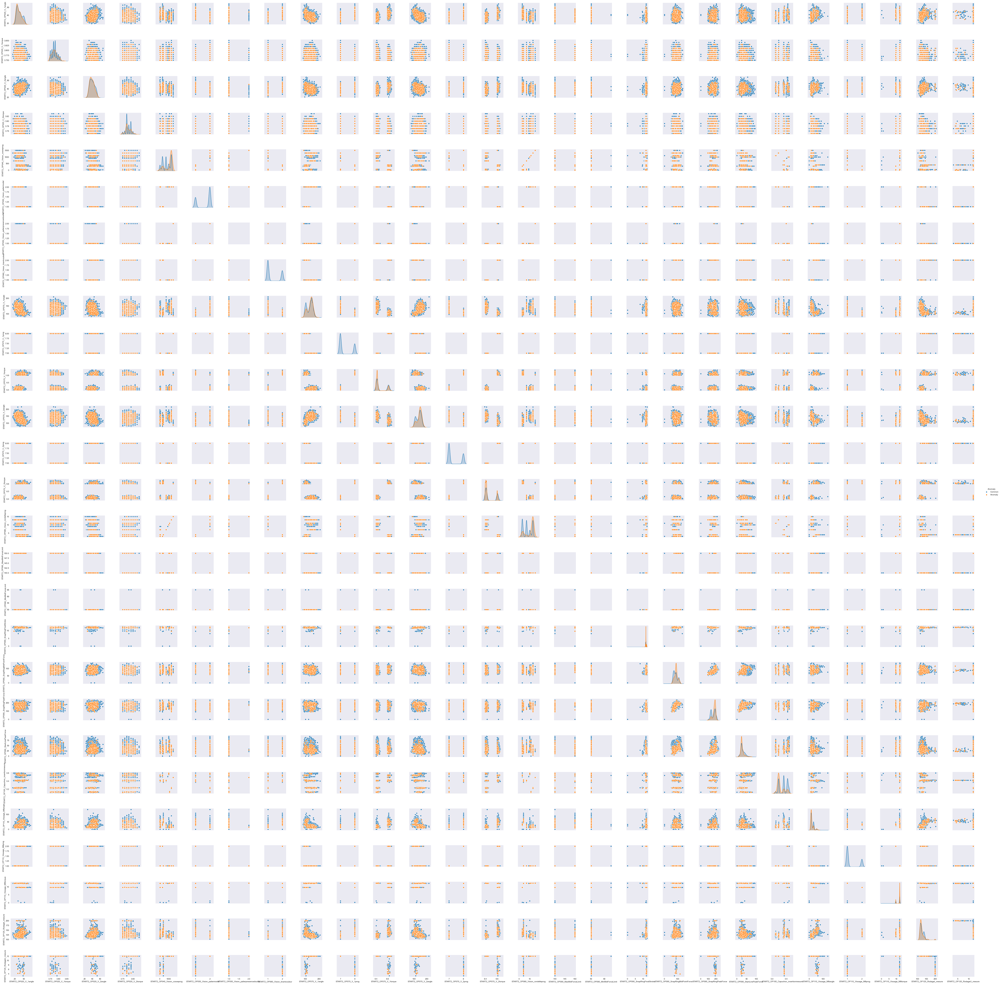

In [10]:
plt.figure(figsize=(100, 100))
sns.pairplot(xtrain_anomalies, hue="Anomaly")

<font color='blue' size=6>Scatter plot</font> <a name="Scatter"></a>

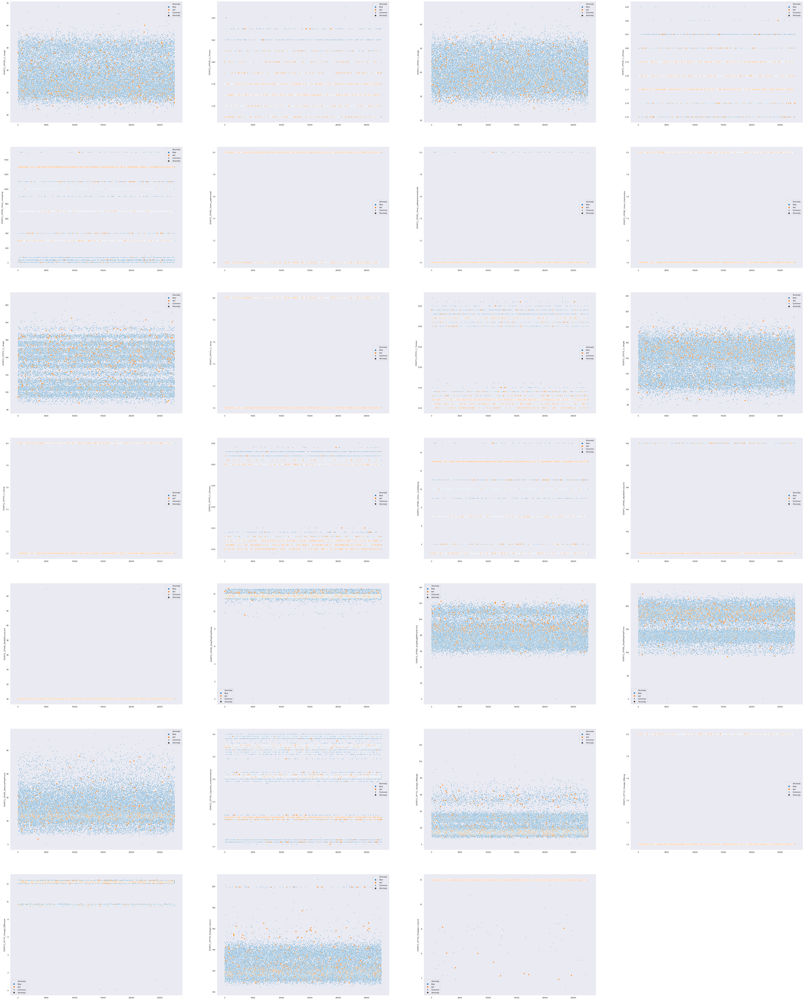

In [11]:
plt.figure(figsize=(70, 90))
plt.title("Plot each features")
for i, col in enumerate(xtrain.columns.tolist()) :
    plt.subplot(7, 4, i+1)
    sns.scatterplot(x=xtrain.index, y=xtrain[col], hue=color_anomaly["Anomaly"], size=anomalies["Anomaly"], sizes={"Common":10, "Anomaly":40})

<font color='blue' size=6>Distribution plot</font> <a name="Distribution"></a>

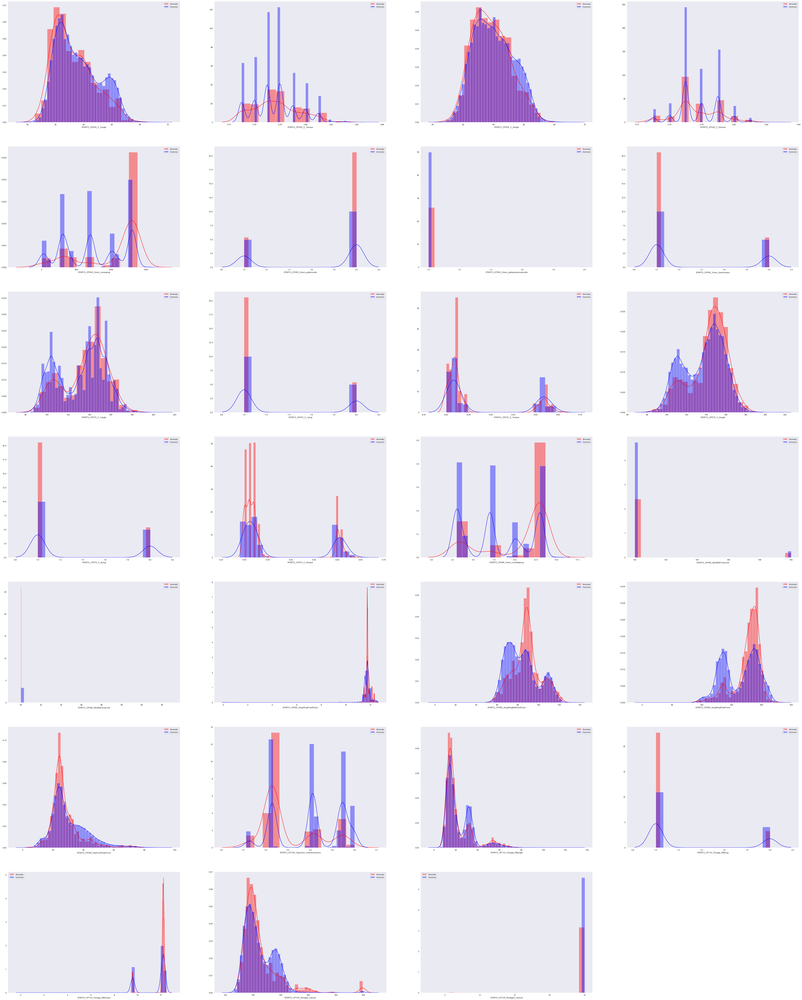

In [12]:
plt.figure(figsize=(70, 90))
plt.title("Distribution features")
for i, col in enumerate(xtrain.columns.tolist()) :
    plt.subplot(7, 4, i+1);
    sns.distplot(xtrain_1[col], color="red", label="Anomaly");
    sns.distplot(xtrain_0[col], color="blue", label="Common");
    plt.legend()

<font color='blue' size=6>Violin plot</font> <a name="Violin"></a>

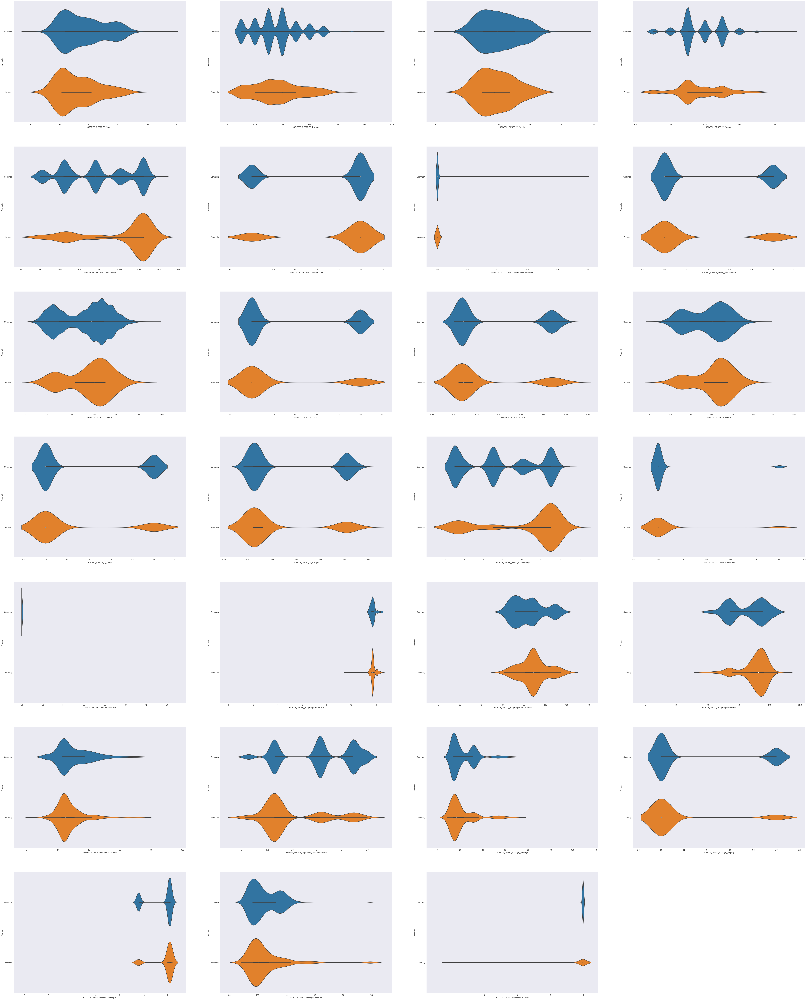

In [13]:
plt.figure(figsize=(70,90))
plt.title("Violinplot features")
for i, col in enumerate(xtrain.columns.tolist()) :
    plt.subplot(7, 4, i+1);
    sns.violinplot(data=xtrain_anomalies, y="Anomaly", x=col);

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## Analysis plot <a name="Analysis"></a> :

* First we can see in pairplot that we don't have a feature that clearly separates anomalies data (labeled 1) in orange from blue
* Secondly with the distribution plot, only on few features we can identify anomalies distribution that seems to be distinguish from the "normal" distribution -> focus on cols_to_keep from my augmented_df() function
* Thirdly, there are some variables with only 2 value possible (binary) so i will create 2 variables which one include binary features and the other one remaining features.

Now we are looking about correlation and create some functions to better process dataset.

In [14]:
cat_features = ((xtrain.nunique() == 2)[(xtrain.nunique() == 2) == True].index).tolist()
other_features = ((xtrain.nunique() == 2)[(xtrain.nunique() == 2) == False].index).tolist()

In [15]:
def augmented_df(df):
    """
    Function to keep features that seems to matter and copy dataset (with data augmentation based on simple operations - and  *)
    """
    cols_to_keep = ["START2_OP100_Capuchon_insertionmesure",
                    "START2_OP080_Vision_rondelleprog",
                    "START2_OP040_Vision_cosseprog",
                    "START2_OP090_SnapRingMidPointForce",
                    "START2_OP120_RodageU_mesure",
                    
                    "START2_OP090_SnapRingPeakForce",
                    "START2_OP110_Vissage_M8torque",
                    "START2_OP110_Vissage_M8prog",
                    
                    "START2_OP090_SnapRingFinalStroke",
                    "START2_OP120_RodageI_mesure",
                    "START2_OP090_StartLinePeakForce",
         
                    #"START2_OP020_V_1torque",
                    #"START2_OP020_V_2torque"
                   ]
    xtrain_augmented = df[cols_to_keep].copy()

    
    #xtrain_augmented = df.copy()
    # Difference augmentation features
    xtrain_augmented["Diff_Rodage_I_U_mesure"] = abs(xtrain_augmented["START2_OP120_RodageI_mesure"] - xtrain_augmented["START2_OP120_RodageU_mesure"])
    xtrain_augmented["Diff_Vision"] = abs(xtrain_augmented["START2_OP040_Vision_cosseprog"] - xtrain_augmented["START2_OP080_Vision_rondelleprog"])
    xtrain_augmented["Diff_SnapRing"] = abs(xtrain_augmented["START2_OP090_SnapRingFinalStroke"] - xtrain_augmented["START2_OP090_SnapRingMidPointForce"])
    
    #xtrain_augmented["Diff_V_1angle"] = abs(xtrain_augmented["START2_OP020_V_1angle"] - xtrain_augmented["START2_OP070_V_1angle"])
    #xtrain_augmented["Diff_V_2angle"] = abs(xtrain_augmented["START2_OP020_V_2angle"] - xtrain_augmented["START2_OP070_V_2angle"])
    xtrain_augmented["Diff_PeakForce"] = abs(xtrain_augmented["START2_OP090_SnapRingPeakForce"] - xtrain_augmented["START2_OP090_StartLinePeakForce"])

    
    # Difference augmentation features
    xtrain_augmented["Mul_Rodage_I_U_mesure"] = abs(xtrain_augmented["START2_OP120_RodageI_mesure"] * xtrain_augmented["START2_OP120_RodageU_mesure"])
    xtrain_augmented["Mul_SnapRing"] = abs(xtrain_augmented["START2_OP090_SnapRingFinalStroke"] * xtrain_augmented["START2_OP090_SnapRingMidPointForce"])
    xtrain_augmented["Mul_Vision"] = abs(xtrain_augmented["START2_OP040_Vision_cosseprog"] * xtrain_augmented["START2_OP080_Vision_rondelleprog"])
        
    xtrain_augmented["Mul_PeakForce"] = abs(xtrain_augmented["START2_OP090_SnapRingPeakForce"] * xtrain_augmented["START2_OP090_StartLinePeakForce"])
    #xtrain_augmented["Mul_V_1angle"] = abs(xtrain_augmented["START2_OP020_V_1angle"] * xtrain_augmented["START2_OP070_V_1angle"])
    #xtrain_augmented["Mul_V_2angle"] = abs(xtrain_augmented["START2_OP020_V_2angle"] * xtrain_augmented["START2_OP070_V_2angle"])

    # New augmented dataset
    return xtrain_augmented

In [16]:
def separate_data(df, cols):
    """
    Function to separate bimodals and multimodals features from dataset
    """
    df_modals = df.copy()
    df_modals = df_modals[cols]
    return df_modals

In [17]:
xtrain_bimodals = xtrain.copy()
xtrain_multimodals = xtrain.copy()
xtrain_bimodals = separate_data(xtrain_bimodals, cat_features)
xtrain_multimodals = separate_data(xtrain_multimodals, other_features)

In [18]:
xtrain_anomalies.nunique()

START2_OP020_V_1angle                         393
START2_OP020_V_1torque                         11
START2_OP020_V_2angle                         370
START2_OP020_V_2torque                          9
START2_OP040_Vision_cosseprog                  16
START2_OP050_Vision_paliermodel                 2
START2_OP050_Vision_palierpresencedouille       2
START2_OP060_Vision_tirantcouleur               2
START2_OP070_V_1angle                         959
START2_OP070_V_1prog                            2
START2_OP070_V_1torque                         16
START2_OP070_V_2angle                        1024
START2_OP070_V_2prog                            2
START2_OP070_V_2torque                         13
START2_OP080_Vision_rondelleprog                8
START2_OP090_MaxMidForceLimit                   2
START2_OP090_MinMidForceLimit                   2
START2_OP090_SnapRingFinalStroke              218
START2_OP090_SnapRingMidPointForce           5964
START2_OP090_SnapRingPeakForce               9479


**Look at the number of different possible value from each features**

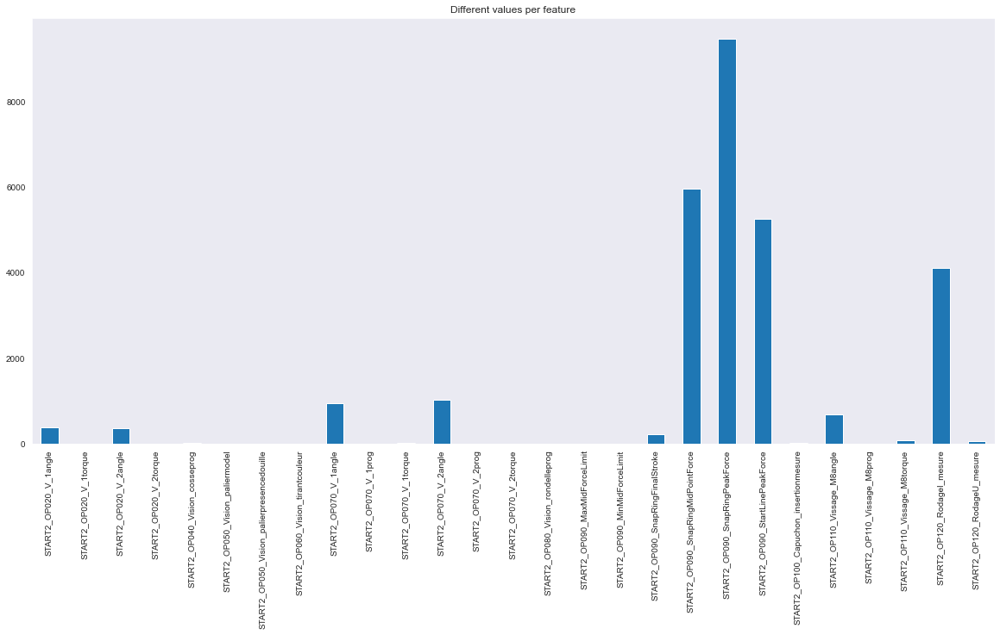

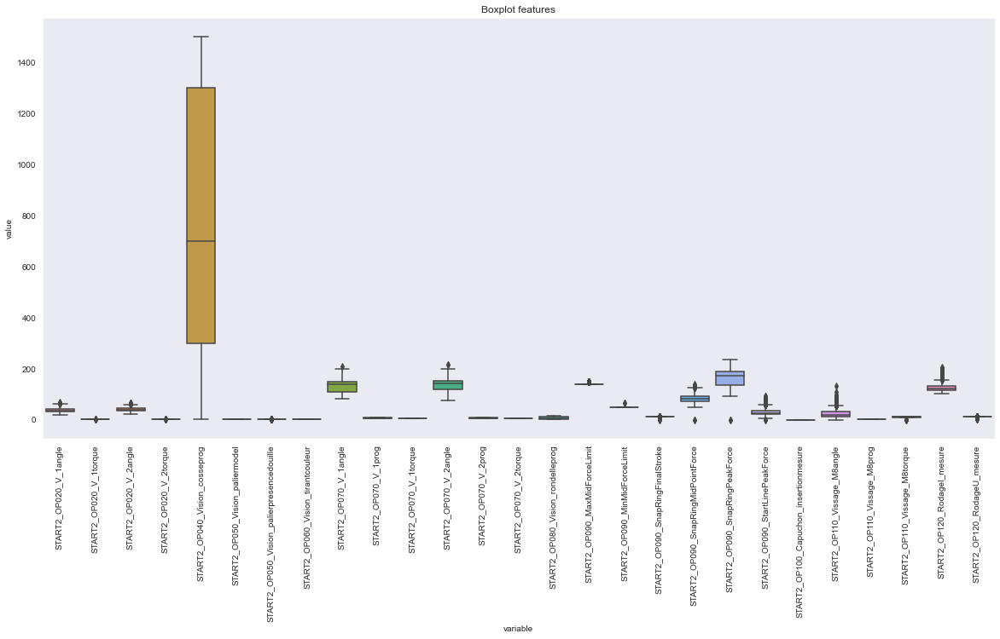

In [19]:
plt.figure(figsize=(20,20));
plt.subplot(2,1,1)
plt.title("Different values per feature")
xtrain.nunique().plot.bar()
plt.figure(figsize=(20,20));
plt.subplot(2,1,2)
plt.title("Boxplot features")
ax = sns.boxplot(x='variable', y='value', data=pd.melt(xtrain));
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

<font color='blue' size=6>HeatMap</font> <a name="HeatMap"></a>

In [24]:
xtrain_label = xtrain.copy()
xtrain_label["Anomaly"] = ytrain["Anomaly"]
xtrain_corr = xtrain_label.corr()

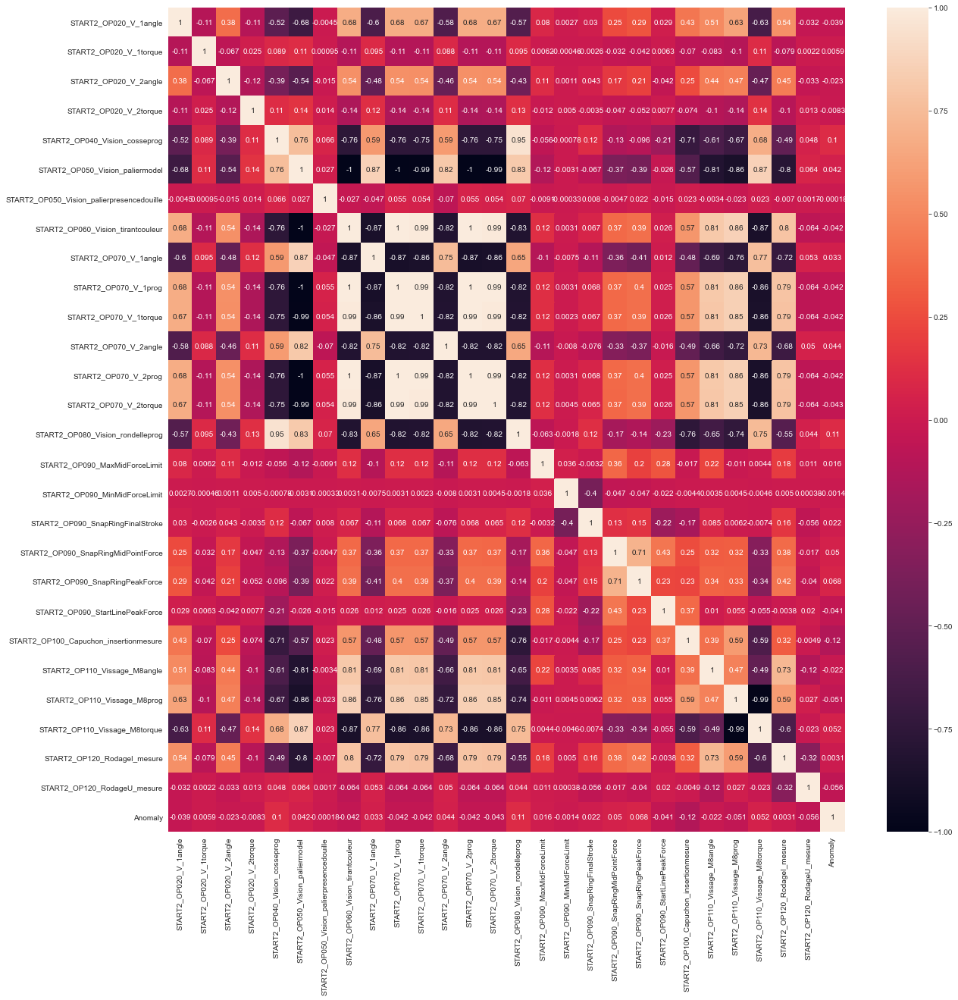

In [25]:
plt.figure(figsize=(20,20))
sns.heatmap(xtrain_corr, annot=True)
plt.show()

Many correlation between V1_angle / V1_torque / V2_angle / V2_torque / rondelleprog / tirantcouleur so can go further with feature engineering and feature selection.

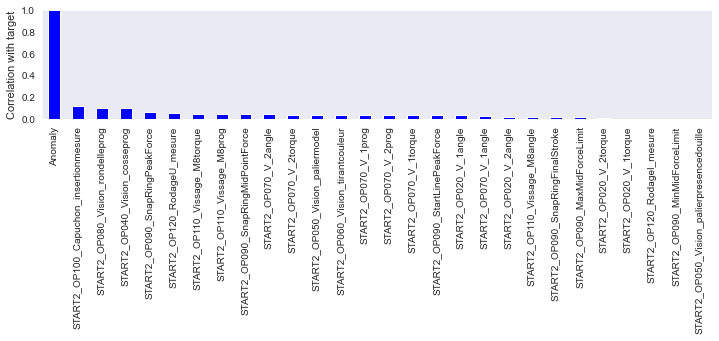

In [26]:
plt.figure(figsize=(12,2))
xtrain_corr['Anomaly'].abs().sort_values(ascending=False)[:28].plot.bar(color='blue')
plt.ylabel('Correlation with target', fontsize=11)
plt.ylim(0.0, 1.0)
plt.show()

<font color='blue' size=6>PCA</font> <a name="HeatMap"></a>

10 component get 0.9999715018725764 percent of the variance 
2 component get 0.9956092024825356 percent of the variance 
[[-441.44032139   34.89778957]
 [-711.76260971    6.95834214]
 [-442.42963903  -43.58046091]
 ...
 [-442.9162429   -54.43603236]
 [ -39.40684729   41.09419472]
 [ 558.90632414  -44.65034935]]


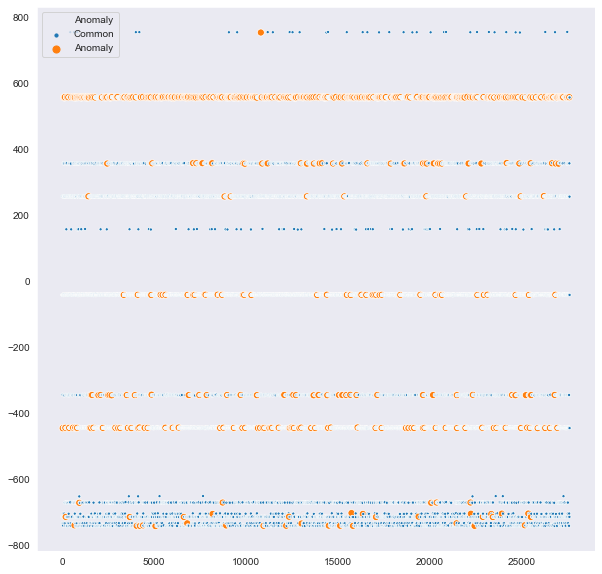

In [27]:
# PCA
pca = PCA(n_components=10)
df_feat_pca = pca.fit_transform(xtrain)
print('10 component get {} percent of the variance '.format(str(sum(pca.explained_variance_ratio_))))

pca = PCA(n_components=2).fit(xtrain)
xtrain_pca = pca.transform(xtrain)
print('2 component get {} percent of the variance '.format(str(sum(pca.explained_variance_ratio_))))

print(xtrain_pca)

plt.figure(figsize=(10, 10))
sns.scatterplot(x=xtrain.index, y=xtrain_pca[:, 0], hue=anomalies["Anomaly"], size=anomalies["Anomaly"], sizes={"Common":10, "Anomaly":50})
plt.show()

PCA don't give me efficient information, only that some anomalies are concentrated on under 600 constant value. Maybe I can try to focus first on those anomalies.

# 3. ML model strategies <a name="ML"></a>

In [47]:
### Folds
cv = StratifiedKFold(n_splits=10)

In [31]:
X_train, X_test, y_train, y_test = train_test_split(df_xtrain_norm, ytrain, test_size=0.2, random_state=42)

## <font color='blue' size=6>First approch ML models classification</font> <a name="First"></a>

few exemples of simple classification ML algorithms :
* Random Forest
* SVC
* Logistic
* Ridge

This part is to have a first idea of how to tune balanced parameter in our case about 40 factor between two classes.
The Ridge Classifier by the regularization parameter seems to give a better AUC so i will use it as a base example to comparative with gradient based models.

### Random forest

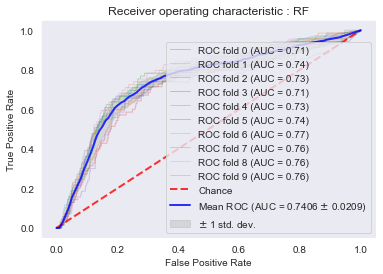

<Figure size 1440x2160 with 0 Axes>

In [34]:
clf_rf_hinge = RandomForestClassifier(n_estimators=1000, bootstrap=True, class_weight='balanced_subsample')
plot_roc_curve_folds(cv, clf_rf_hinge, xtrain.values, ytrain.values, "RF")

### SVC

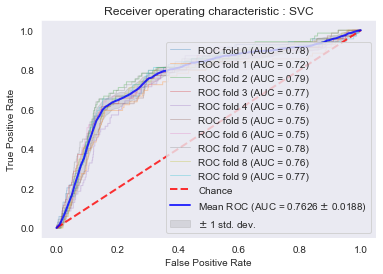

<Figure size 1440x2160 with 0 Axes>

In [35]:
clf_svc = SVC(class_weight='balanced')
plot_roc_curve_folds(cv, clf_svc, xtrain.values, ytrain.values, "SVC")

### Logistic

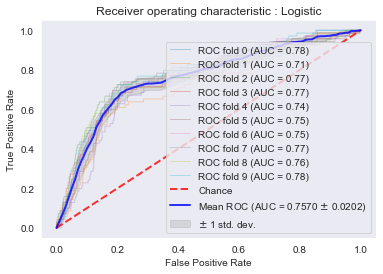

<Figure size 1440x2160 with 0 Axes>

In [36]:
clf_log =LogisticRegression(C=0.0005, class_weight={0: 1, 1: 40}, max_iter=100000)
plot_roc_curve_folds(cv, clf_log, xtrain.values, ytrain.values, "Logistic")

### Ridge

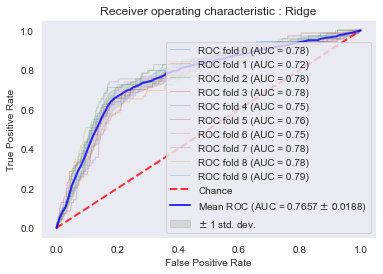

<Figure size 1440x2160 with 0 Axes>

In [38]:
clf_ridge = RidgeClassifier(alpha=40.19, class_weight='balanced')
plot_roc_curve_folds(cv, clf_ridge, xtrain.values, ytrain.values, "Ridge")

## <font color='blue' size=6>Unbalanced methods</font> <a name="Unbalanced"></a>

I will try some unbalanced algorithms that try to correct this problem with the python lib imblearn. There are 3 best known methods :

* Undersampling 
* Oversampling
* SMOTE 

One way to solve this problem is to oversample the examples in the minority class. This can be achieved by simply duplicating examples from the minority class in the training dataset prior to fitting a model. This can balance the class distribution but does not provide any additional information to the model. SMOTE works by selecting examples that are close in the feature space, drawing a line between the examples in the feature space and drawing a new sample at a point along that line.

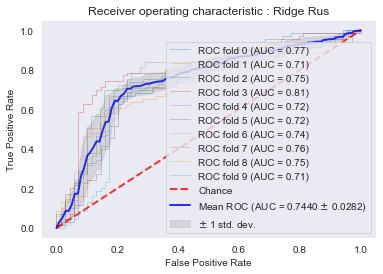

<Figure size 1440x2160 with 0 Axes>

In [39]:
rus = RandomUnderSampler(random_state=42)
X_resampled_rus, y_resampled_rus = rus.fit_resample(xtrain, ytrain)
clf_ridge_rus = clf_ridge.fit(X_resampled_rus, y_resampled_rus)
plot_roc_curve_folds(cv, clf_ridge_rus, X_resampled_rus.values, y_resampled_rus.values, "Ridge Rus")

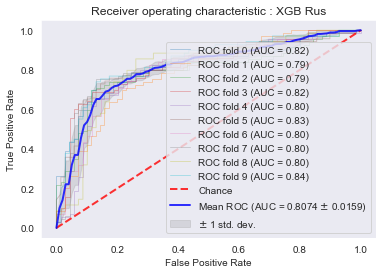

<Figure size 1440x2160 with 0 Axes>

In [40]:
xgb_rus = xgb.XGBRFClassifier(booster='gbtree',
                       tree_method='hist',
                       objective='binary:logistic',
                       max_depth=5,
                       #scale_pos_weight = scaler_weights,
                       seed = 1000)
#xgb_rus = boost.fit(X_resampled_rus, y_resampled_rus)
plot_roc_curve_folds(cv, xgb_rus, X_resampled_rus.values, y_resampled_rus.values, "XGB Rus")

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

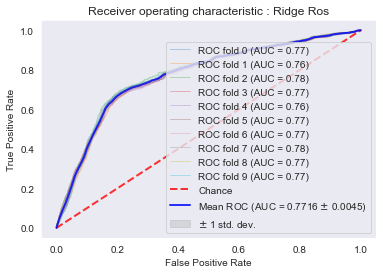

<Figure size 1440x2160 with 0 Axes>

In [41]:
ros = RandomOverSampler(random_state=42)
X_resampled_ros, y_resampled_ros = ros.fit_resample(xtrain, ytrain)
clf_ridge_ros = clf_ridge.fit(X_resampled_ros, y_resampled_ros)
plot_roc_curve_folds(cv, clf_ridge_ros, X_resampled_ros.values, y_resampled_ros.values, "Ridge Ros")

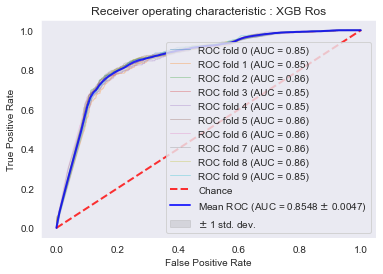

<Figure size 1440x2160 with 0 Axes>

In [42]:
xgb_ros = xgb.XGBRFClassifier(booster='gbtree',
                       tree_method='hist',
                       objective='binary:logistic',
                       max_depth=5,
                       #scale_pos_weight = scaler_weights,
                       seed = 1000)
#xgb_ros = xgb_ros.fit(X_resampled_ros, y_resampled_ros)
plot_roc_curve_folds(cv, xgb_ros, X_resampled_ros.values, y_resampled_ros.values, "XGB Ros")

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

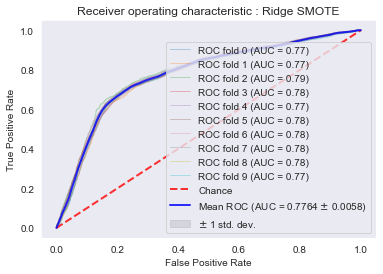

<Figure size 1440x2160 with 0 Axes>

In [45]:
sm = SMOTE(random_state=42)
X_resampled_sm, y_resampled_sm = sm.fit_resample(xtrain, ytrain)
clf_ridge_ros = clf_ridge.fit(X_resampled_sm, y_resampled_sm)
plot_roc_curve_folds(cv, clf_ridge_ros, X_resampled_sm.values, y_resampled_sm.values, "Ridge SMOTE")

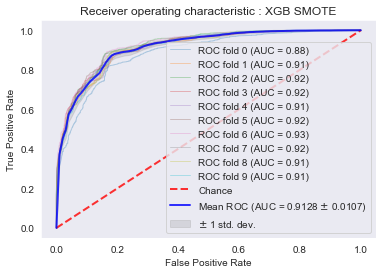

<Figure size 1440x2160 with 0 Axes>

In [46]:
xgb_sm = xgb.XGBRFClassifier(booster='gbtree',
                       tree_method='hist',
                       objective='binary:logistic',
                       max_depth=5,
                       #scale_pos_weight = scaler_weights,
                       seed = 1000)
    #learning_rate=0.01, max_depth=6, n_estimators=300)
plot_roc_curve_folds(cv, xgb_sm, X_resampled_sm.values, y_resampled_sm.values, "XGB SMOTE")

**Now we clearly see that SMOTE method seems to give better results and, I improved a little my score but not so big. Certainly beacuase in test set there is always this unbalanced distribution so need to find better method.**

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## <font color='blue' size=6>Boosting gradient methods</font>  <a name="BoostingGradient"></a>

Now I will use 3 base gradient methods boosting :


**XGBoost** was developped in 2016 by Tianqi Chen as a custom variant of Gradient Tree Boosting that better suited his research requirements. After successfully winning the Higgs Machine Learning Competition (particule physics competition with 11 million observations), XGBoost grew in popularity and features heavily in the winning solutions of many Kaggle competitions. Compared to Vanilla Gradient Tree Boosting, XGBoost brings to the table numerous improvements, those relevant to this competition being:

- **Better Loss Approximation with 2nd Order Taylor Approximation**: Better accuracy and faster runtime
- **GPU Support**
- **Implicit Regularization**: Early Stopping on validation set (akin to Deep Learning)
- **Explicit Regularization**: Tree leaf penalization

* Hyperparameters of interest:

- **tree_method**: The algorithm used to build individual trees. This is a histogram-based algorithm where continuous values are discretized into bins, which speeds up the search for the optimal split (the same method used for LightGBM). in the video from references (Mateusz Susik for PyData explain that histogram present better performance)
- **eta**: shrinkage rate. Value of 0.1 is a good comprise between speed and convergence.
- **max_depth**: maximum tree depth. Higher values lead to more complex trees.
- **alpha**: $L_1$-regularization on trees.
- **lambda**: $L_2$-regularization on trees. Same logic as $L_1$-regularization, with the added benefit of reducing the effect of data multicollinearity.
- **scale_pos_weight**: parameter for handling class imbalance, typically the value chosen is the ratio between the sum of examples from the majority class and those from the minority class.

------------------------------------------------------------------------------------------------------------------------------

**LightGBM** was developped by Microsoft Research and released in 2017. Its aim is simply to be faster than XGBoost. They achieved this by:

- **Discretizing into bins each continuous feature at split time**. Instead of greedily sweeping every data point, LightGBM only sweeps over bins (called histogram-based). This speeds up training considerably;
- **Most promising leaves are prioritized during tree growth**. XGBoost's default implementation grows trees equally across branches creating equal but wide trees. LightGBM prefers to only grows promising leaves, creating asymetric trees.

* Hyperparameters of interest:

- **boosting_type**: there are 4 boosting types offered by LightGBM, which are `gbdt` (default option), `goss` (slightly faster), `dart` (drops trees for prediction but extremely slow) and `rf` (random forests). In practice, `gbdt` and `goss` behave similarly;
- **num_leaves**: this parameter was set arbitrarily whereas convention is to set it at $2^d$ where $d$ is depth. A significantly lower value does reduce risk of overfitting.

------------------------------------------------------------------------------------------------------------------------------

**CatBoost** was developped by Yandex and was also released in 2017. Contrasting LightGBM's goal of simply besting XGBoost at speed, CatBoost's goal is better generalization than its previous competitors. CatBoost's claim to fame is its easier handling of categorical features. But as the training set doesn't contain categorical features, this advantage will not be used. It supposedly provides **better generalization on smaller datasets** by reducing tree correlation by randomly shuffling observations at splitting time.

* Hyperparameters of interest:

- **Already same hyperparameters as two others gradient boosting algorithms**
- **Include a categorial feature hyperparameter to distinguish from other variables**
- **Also include a gridsearch method that i will use to tune hyperparameters**

------------------------------------------------------------------------------------------------------------------------------

**Advice for next time :** In advance from the following code execution, I didn't use GPU ressources because I thought that for "only" 27000 observations it will be complicated to set it on my computer.
But when I use gridsearch cross-validation to tune hyperparameter that can be great to use it, that's may be one of my problem to get a better performance tuning hyperparameters.

### XGBOOST

In [465]:
params = {'max_depth' : 6,
          'learning_rate' : 0.01,
          'alpha' : 2.0,
          'lambda' : 2.0,
          'eta' : 2.0 ,
          'learning_rate' : 0.01, 
          'max_depth' : 6, 
          'n_estimators' : 300, 
          'scale_pos_weight' : None,
          'n_estimators' : 300,
          'tree_method' : 'hist',
          'objective' : 'binary:logistic'
         }

xgbboost_optim = xgb.XGBClassifier(parameters = params)
#scale_pos_weight=10
scores_Boost = cross_val_score(xgbboost_optim, xtrain_augnorm_filter, ytrain, scoring='roc_auc', n_jobs=-1, cv=cv_xgb)

print('Best Score: %s' % np.max(scores_Boost))
print('Worst Score: %s' % np.min(scores_Boost))
print('Mean Score: %s' % np.mean(scores_Boost))

xgbboost_optim.fit(xtrain, ytrain)
y_eval_boost = xgbboost_optim.predict(xtrain)
auc_eval = roc_auc_score(y_eval_boost, ytrain)
print("AUC score = {}".format(auc_eval))
y_proba = xgbboost_optim.predict_proba(xtrain)
print(y_proba)
#y_pred_boost = boost.predict(xtest)
#y_pred_counter = Counter(y_pred_boost)
#print(y_pred_counter)

Best Score: 0.8493238510856096
Worst Score: 0.7062237687934974
Mean Score: 0.7744176691054507
[22:02:13] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:516: 
Parameters: { parameters } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


AUC score = 0.9758325396056163


NameError: name 'boost' is not defined

### LIGHTGBM

In [463]:
CV_NUMBER = 5

excl = ["Anomaly"]
features = [f for f in xtrain_label.columns if f not in excl]

auc_list = []
recall_list = []

# Cross Validation
for idx in range(CV_NUMBER):

    # Split train and test
    X_train, X_test, y_train, y_test = train_test_split(xtrain_label[features], ytrain, test_size=0.2, random_state=42)
    # Create dataset for lightgbm
    lgb_train = lgb.Dataset(X_train, y_train)
    lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)

    # Params
    params = {
        'task': 'train',
        'application': 'binary',
        'objective': 'binary',
        'metric': 'auc',
        #'objective' : custom_loss_function,
        #'scale_pos_weight': 20,
        'boosting': 'gbdt',
        'tree_method':'hist',
        'num_leaves': 800,
        'num_trees': 200,
        #'feature_fraction': 0.9,
        #'bagging_fraction': 0.8,
        #'bagging_freq': 5,
        #'learning_rate': 0.05,
        #'verbose': -1
    }
    
    lgbbst = lgb.train(params, lgb_train, num_boost_round=800, valid_sets=lgb_eval, early_stopping_rounds=50)    
    y_pred = lgbbst.predict(X_test, num_iteration=lgbbst.best_iteration)
    #y_pred = np.round_(y_pred, 0)

    auc_list.append(roc_auc_score(y_test, y_pred))
    #recall_list.append(recall_score(y_test, y_pred))


[LightGBM] [Warning] Unknown parameter: tree_method
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Unknown parameter: tree_method
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Info] Number of positive: 543, number of negative: 21525
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2686
[LightGBM] [Info] Number of data points in the train set: 22068, number of used features: 26
[LightGBM] [Warning] Unknown parameter: tree_method
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.024606 -> initscore=-3.6798

### CATBOOST

0:	total: 54.2ms	remaining: 16.2s
1:	total: 81.9ms	remaining: 12.2s
2:	total: 124ms	remaining: 12.3s
3:	total: 170ms	remaining: 12.5s
4:	total: 211ms	remaining: 12.4s
5:	total: 222ms	remaining: 10.9s
6:	total: 235ms	remaining: 9.82s
7:	total: 280ms	remaining: 10.2s
8:	total: 299ms	remaining: 9.65s
9:	total: 346ms	remaining: 10s
10:	total: 394ms	remaining: 10.3s
11:	total: 445ms	remaining: 10.7s
12:	total: 492ms	remaining: 10.9s
13:	total: 551ms	remaining: 11.3s
14:	total: 603ms	remaining: 11.5s
15:	total: 651ms	remaining: 11.6s
16:	total: 675ms	remaining: 11.2s
17:	total: 718ms	remaining: 11.2s
18:	total: 770ms	remaining: 11.4s
19:	total: 812ms	remaining: 11.4s
20:	total: 855ms	remaining: 11.4s
21:	total: 869ms	remaining: 11s
22:	total: 904ms	remaining: 10.9s
23:	total: 949ms	remaining: 10.9s
24:	total: 999ms	remaining: 11s
25:	total: 1.04s	remaining: 11s
26:	total: 1.08s	remaining: 11s
27:	total: 1.12s	remaining: 10.9s
28:	total: 1.17s	remaining: 10.9s
29:	total: 1.22s	remaining: 11s


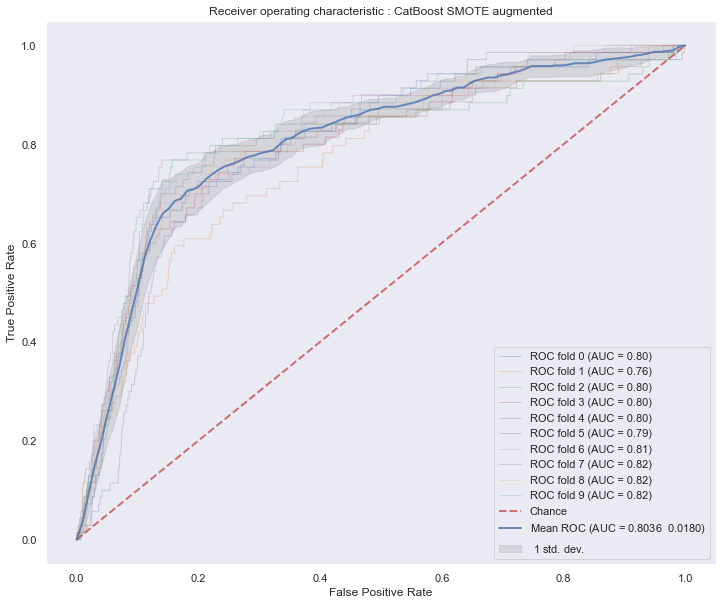

<Figure size 1440x2160 with 0 Axes>

0:	total: 25.5ms	remaining: 7.61s
1:	total: 86.7ms	remaining: 12.9s
2:	total: 147ms	remaining: 14.6s
3:	total: 210ms	remaining: 15.6s
4:	total: 272ms	remaining: 16s
5:	total: 329ms	remaining: 16.1s
6:	total: 383ms	remaining: 16s
7:	total: 445ms	remaining: 16.2s
8:	total: 499ms	remaining: 16.1s
9:	total: 553ms	remaining: 16s
10:	total: 601ms	remaining: 15.8s
11:	total: 663ms	remaining: 15.9s
12:	total: 728ms	remaining: 16.1s
13:	total: 755ms	remaining: 15.4s
14:	total: 812ms	remaining: 15.4s
15:	total: 877ms	remaining: 15.6s
16:	total: 942ms	remaining: 15.7s
17:	total: 997ms	remaining: 15.6s
18:	total: 1.03s	remaining: 15.2s
19:	total: 1.07s	remaining: 15s
20:	total: 1.11s	remaining: 14.8s
21:	total: 1.16s	remaining: 14.6s
22:	total: 1.21s	remaining: 14.6s
23:	total: 1.26s	remaining: 14.5s
24:	total: 1.3s	remaining: 14.3s
25:	total: 1.35s	remaining: 14.2s
26:	total: 1.41s	remaining: 14.2s
27:	total: 1.43s	remaining: 13.9s
28:	total: 1.49s	remaining: 13.9s
29:	total: 1.52s	remaining: 13.

In [601]:
catboost = cbt.CatBoostClassifier(iterations=300,
                                  learning_rate=0.01,
                                  depth=10, 
                                  #l2_leaf_reg=2, 
                                  #bootstrap_type='Bernoulli', 
                                  #subsample=0.95,
                                  #scale_pos_weight=scaler_weights, 
                                  eval_metric='AUC',
                                  od_type='Iter',
                                  #allow_writing_files=False,
                                  #od_wait=500,
                                  #random_seed=1000
                                 )

"""
catboost = cbt.CatBoostClassifier(iterations=50,
                                  learning_rate=0.01,
                                  depth=8, 
                                  #l2_leaf_reg=5, 
                                  #bootstrap_type='Bernoulli', 
                                  #subsample=0.95,
                                  #scale_pos_weight=scaler_weights, 
                                  eval_metric='AUC',
                                  od_type='Iter',
                                  #allow_writing_files=False,
                                  #od_wait=500,
                                  #random_seed=1000
                                 )

"""

plot_roc_curve_folds(cv, catboost, xtrain.values, ytrain.values, "CatBoost SMOTE augmented")
catboost.fit(X_train, y_train)#,verbose_eval=10)

y_cat = catboost.predict(X_test)

Now use a gridsearch to fine tune catboost classifier

In [667]:
clf_cat = cbt.CatBoostClassifier()

paramscat = {'learning_rate': [0.01, 0.1],
             'iterations':[300,100,600],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9],
        'bootstrap_type':["Bayesian", "Bernoulli", "MVS"],
        'subsample':[0.6, 0.8, 0.95],
        'auto_class_weights': ["Balanced", "SqrtBalanced"]}

gridcat = clf_cat.grid_search(paramscat,
                              X=xtrain_augnorm_filter, 
                              y=ytrain,
                              cv=cv,
                              plot=True)


#gridcat.fit()
#print(gridcat.cv_results_)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 0.5264536785
bestIteration = 299

0:	loss: 0.5264537	best: 0.5264537 (0)	total: 2.07s	remaining: 55m 54s

bestTest = 0.5188890425
bestIteration = 299

1:	loss: 0.5188890	best: 0.5188890 (1)	total: 4.07s	remaining: 54m 55s

bestTest = 0.5102328015
bestIteration = 52

2:	loss: 0.5102328	best: 0.5102328 (2)	total: 6.13s	remaining: 55m 2s

bestTest = 0.5151047734
bestIteration = 71

3:	loss: 0.5151048	best: 0.5102328 (2)	total: 8.22s	remaining: 55m 19s

bestTest = 0.528227628
bestIteration = 299

4:	loss: 0.5282276	best: 0.5102328 (2)	total: 10.3s	remaining: 55m 16s

bestTest = 0.5191417406
bestIteration = 299

5:	loss: 0.5191417	best: 0.5102328 (2)	total: 12.4s	remaining: 55m 35s

bestTest = 0.5141935997
bestIteration = 94

6:	loss: 0.5141936	best: 0.5102328 (2)	total: 14.4s	remaining: 55m 26s

bestTest = 0.5122557801
bestIteration = 78

7:	loss: 0.5122558	best: 0.5102328 (2)	total: 16.7s	remaining: 56m 14s

bestTest = 0.5270070024
bestIteration = 299

8:	loss: 0.5270070	best:

### 
## <font color='blue' size=6>SHAP and SelectFromModel based on XGB</font>  <a name="Best"></a>
SHAP is SHapley Additive exPlanations and this library turns ML models from black boxes to human-readable figures.
So I decided to use it combine with a SelectFromModel function to create a better expleanable booster classifier and the result will be my best strategy.

All is based on my best booster algorithm -> XGBoostClassifier

In [16]:
selector1 = SelectFromModel(estimator=xgb.XGBRFClassifier(base_score=0.5,
                                                          tree_method='hist',
                                                          booster='gbtree',
                                                          colsample_bylevel=1,
                                                           colsample_bynode=1,
                                                           colsample_bytree=1, gamma=0,
                                                           learning_rate=0.01, 
                                                           max_delta_step=0,
                                                           max_depth=3,  
                                                           min_child_weight=1,
                                                           missing=None,
                                                           n_estimators=100,
                                                           n_jobs=1, 
                                                           nthread=None,
                                                           objective='binary:logistic',
                                                           random_state=1, 
                                                           reg_alpha=0,
                                                           reg_lambda=1,
                                                           scale_pos_weight=1,
                                                           seed=None, silent=None, 
                                                           subsample=1,
                                           verbosity=1), max_features=None, norm_order=1).fit(xtrain, ytrain)

X_train1 = xtrain.loc[:, selector1.get_support()]
X_test1 = xtest.loc[:, selector1.get_support()]

X_train1

,START2_OP040_Vision_cosseprog,START2_OP090_SnapRingMidPointForce,START2_OP090_SnapRingPeakForce,START2_OP120_RodageI_mesure,START2_OP120_RodageU_mesure
0,300.0,71.52,122.23,126.96,11.97
1,30.0,67.38,163.78,133.88,11.97
2,300.0,89.09,207.73,135.28,11.97
3,1000.0,93.45,177.31,116.51,11.97
4,400.0,85.17,174.73,140.92,11.98
...,...,...,...,...,...
27581,1000.0,116.56,201.69,122.47,11.97
27582,1300.0,112.61,196.75,122.30,11.97
27583,300.0,95.33,212.44,134.88,11.98
27584,700.0,65.21,135.55,115.81,11.97


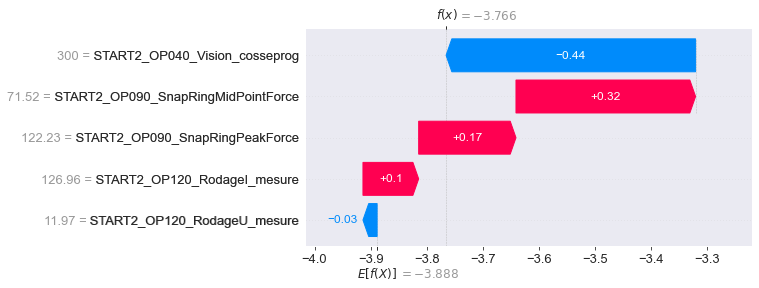

In [28]:
# train an XGBoost model
model1 = xgb.XGBClassifier().fit(X_train1, ytrain)

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer1 = shap.Explainer(model1)
shap_values1 = explainer1(X_train1)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values1[0])

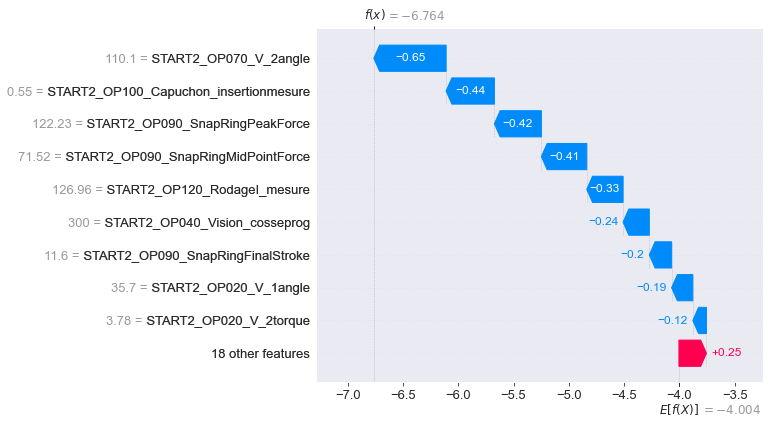

In [24]:
# train an XGBoost model
modelbasic = xgb.XGBClassifier().fit(xtrain, ytrain)

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainerbasic = shap.Explainer(modelbasic)
shap_valuesbasic = explainerbasic(xtrain)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_valuesbasic[0])

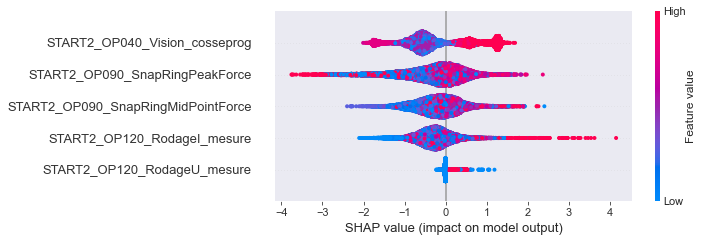

In [31]:
shap.plots.beeswarm(shap_values1)

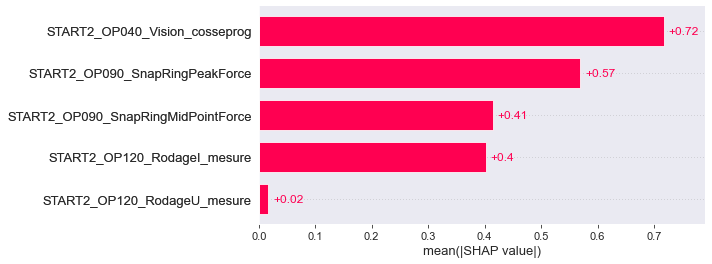

In [32]:
shap.plots.bar(shap_values1)

In [46]:
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5, 6],
        'tree_method':['hist'],
        'reg_alpha':[0, 1, 2],
        'reg_lambda':[0, 1, 2],
        }

xgbclassifier = xgb.XGBClassifier(learning_rate=0.02, n_estimators=600, objective='binary:logistic',
                    silent=True, nthread=1)

folds = 3
param_comb = 5

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 1001)

random_search = RandomizedSearchCV(xgbclassifier, param_distributions=params, n_iter=param_comb, scoring='roc_auc', cv=skf.split(X_train1,ytrain), verbose=3, random_state=1001 )

# Here we go
random_search.fit(X_train1, ytrain)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV] tree_method=hist, subsample=0.8, reg_lambda=0, reg_alpha=1, min_child_weight=5, max_depth=3, gamma=5, colsample_bytree=0.8 
[08:31:25] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  tree_method=hist, subsample=0.8, reg_lambda=0, reg_alpha=1, min_child_weight=5, max_depth=3, gamma=5, colsample_bytree=0.8, score=0.787, total=   1.4s
[CV] tree_method=hist, subsample=0.8, reg_lambda=0, reg_alpha=1, min_child_weight=5, max_depth=3, gamma=5, colsample_bytree=0.8 
[08:31:26] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s remaining:    0.0s


[CV]  tree_method=hist, subsample=0.8, reg_lambda=0, reg_alpha=1, min_child_weight=5, max_depth=3, gamma=5, colsample_bytree=0.8, score=0.818, total=   1.3s
[CV] tree_method=hist, subsample=0.8, reg_lambda=0, reg_alpha=1, min_child_weight=5, max_depth=3, gamma=5, colsample_bytree=0.8 
[08:31:27] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.7s remaining:    0.0s


[CV]  tree_method=hist, subsample=0.8, reg_lambda=0, reg_alpha=1, min_child_weight=5, max_depth=3, gamma=5, colsample_bytree=0.8, score=0.783, total=   1.4s
[CV] tree_method=hist, subsample=0.8, reg_lambda=2, reg_alpha=1, min_child_weight=5, max_depth=6, gamma=0.5, colsample_bytree=0.6 
[08:31:29] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[CV]  tree_method=hist, subsample=0.8, reg_lambda=2, reg_alpha=1, min_child_weight=5, max_depth=6, gamma=0.5, colsample_bytree=0.6, score=0.784, total=   1.8s
[CV] tree_method=hist, subsample=0.8, reg_lambda=2, reg_alpha=1, min_child_weight=5, max_depth=6, gamma=0.5, colsample_bytree=0.6 
[08:31:30] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.c

[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:   21.4s finished


RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x7fc2add6cba0>,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=0.02,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing...
                                           scale_pos_weight=None, silent=True,
                                           subsample=None, tree_method=None,
                                           validate_parameters=None,
                                        

In [47]:
random_search.best_params_

{'tree_method': 'hist',
 'subsample': 0.8,
 'reg_lambda': 0,
 'reg_alpha': 1,
 'min_child_weight': 5,
 'max_depth': 3,
 'gamma': 5,
 'colsample_bytree': 0.8}

In [141]:
clf.fit(X_train, y_train)
submit = clf.decision_function(X_test)

# Save the anomaly scores to file
print(submit.shape)
np.savetxt('last.csv', submit, fmt = '%1.8f', delimiter=',')

(27587,)


## <font color='blue' size=6>Stacking</font>  <a name="Stacking"></a>

In [ ]:
# Turn off regularization with C=1e10
meta_model = LogisticRegression(C=1e10)
test_predictions = (y_prob_test_xgb, y_prob_test_lgb, y_prob_test_cbt)
stacked_test_predictions = np.column_stack(test_predictions)
meta_model.fit(stacked_test_predictions, ytrain)

# Predictions
y_prob_test_stacked = meta_model.predict_proba(xtest_aug)[:,1]

In [274]:
pd.Series(meta_model.coef_[0], index=['XGBoost', 'LightGBM', 'CatBoost'])

XGBoost      -1.131231
LightGBM    636.699210
CatBoost      4.848011
dtype: float64

## <font color='blue' size=6>Example of MLP</font>  <a name="MLP"></a>

In [486]:
def make_model(metrics=METRICS, output_bias=None):
    if output_bias is not None:
        output_bias = tensorflow.keras.initializers.Constant(output_bias)
    model = tensorflow.keras.Sequential([
        tensorflow.keras.layers.Dense(16, 
                                      activation='relu', 
                                      input_shape=(train_features.shape[-1],)), 
        tensorflow.keras.layers.Dropout(0.2), 
        tensorflow.vkeras.layers.Dense(1, 
                                       activation='sigmoid', 
                                       bias_initializer=output_bias),
    ])
    model.compile(
        optimizer=keras.optimizers.Adam(lr=1e-3),
        loss=keras.losses.BinaryCrossentropy(),
        metrics=metrics)
    return model

def define_model1(n_input):
    # define model
    model = Sequential()
    # define first hidden layer and visible layer
    model.add(Dense(10, input_dim=n_input, activation='relu', kernel_initializer='he_uniform'))
    # add Dropout regularization
    model.add(Dropout(0.2))
    # define output layer
    model.add(Dense(1, activation='sigmoid'))
    # define loss and optimizer
    model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['AUC'])
    return model

In [488]:
# define the model
n_input = X_train_aug.shape[1]
model = define_model()
model1 = define_model1(n_input)

# fit model
weights = {0:1, 1:39}
history = model.fit(X_train_aug, y_train_aug, class_weight=weights, epochs=100, verbose=0)
history1 = model1.fit(X_train_aug, y_train_aug, class_weight=weights, epochs=100, verbose=0)

# make predictions on the test dataset
yhat = model.predict(X_test_aug)
yhat1 = model1.predict(X_test_aug)
# evaluate the ROC AUC of the predictions
score = roc_auc_score(y_test_aug, yhat)
print('ROC AUC: %.3f' % score)
score1 = roc_auc_score(y_test_aug, yhat1)
print('ROC AUC: %.3f' % score1)
# plot_roc_curve_folds(cv, model, X_test_aug.values, y_test_aug.values, "Keras Cost sensitive")

ROC AUC: 0.787
ROC AUC: 0.794


# 4. CONCLUSION <a name="Conclusion"></a>

**So now that I have explored many strategies, let's detailed and sum up**

Firstly, I try to use basic algorithms like RF / SVC / LogisticRegression / RidgeClassifier, I suppose that Ridge would be better with L2-Regularization from unbalanced dataset where we can be easily lock on a local minimum and not global.
And from a Cross-validation it seems that my suggestion was true so I test it and I get a 0.76 score.

Secondly, I try to focus on distribution and which features can better explained the output. So I define an augemented_df() function that keep only features that seems to be reveleant and try to augmented dataset with basic operation like difference and multiplication between features. I find 5 best features from plots but I try with 6 others features also to see if it's tuned auc score. 

I use many test (about 30) with not very optimize algorithm result so I loose many submissions for nothing just because others made many and increase their ranking.

Thirdly, I try a NN approach with to MLP code and it seems to bbe better than basic algorithms tested but maybe I could make better with gradient based algorithms. So I decide to test 3 boosting algorithms : XGBoost, LightGBM, and Catboost.
XGB and Catboost give me better results so finally I decided to tune those algorithms and stack them with a LogisticRegression.

Finally, I combine SHAP and SelectFromModel strategy with the best gradient based algorithm XGBoost and I confirm the result about best explainable features (the 5 from distribution observation) and how each influence on predictions.
And I get my best score about 0.8 with it.

Strategies explored:

| Model(s) | AUC on test dataset |
|-------------|-------------:|
| Basic models - best RidgeClassifier | 0.76 |
| MLP | 0.786 |
| XGBoost + feature engineering | 0.78 |
| XGBoost & SMOTE + feature engineering | 0.794 |
| CatBoost | 0.79 |
| **XGBoost & SHAP + SelectFromModel strategy** | **0.800396420193** |

<br>

**Overture :** 
I think that my main problem is on anomalies, I don't try to investigate and see if there is duplicate values. I suspect that maybe some piece from Valeo's inspection were diagnosted as anomaly and maybe return in factory and a new valid data were inserted creating duplicated values. So create feature about 0/1 if it's duplicated or not.

# REFERENCES <a name="References"></a>

Good paper for unbalanced dataset :

https://sci2s.ugr.es/imbalanced

https://www.svds.com/learning-imbalanced-classes/

https://towardsdatascience.com/outlier-detection-with-one-class-svms-5403a1a1878c


Boosting :

https://www.youtube.com/watch?v=5CWwwtEM2TA

https://machinelearningmastery.com/gentle-introduction-xgboost-applied-machine-learning/

https://www.quantmetry.com/blog/classification-et-desequilibre-de-classes/

https://lavanya.ai/2019/06/27/battle-of-the-boosting-algorithms/

https://towardsdatascience.com/catboost-vs-light-gbm-vs-xgboost-5f93620723db#:~:text=Unlike%20CatBoost%20or%20LGBM%2C%20XGBoost,supplying%20categorical%20data%20to%20XGBoost

https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

https://www.youtube.com/watch?v=usdEWSDisS0

MLP :

https://machinelearningmastery.com/binary-classification-tutorial-with-the-keras-deep-learning-library/

https://machinelearningmastery.com/cost-sensitive-neural-network-for-imbalanced-classification/

SHAP & SelectFromModel :

https://towardsdatascience.com/using-selectfrommodel-to-create-a-better-xgbclassifier-model-ddebdf9b68fe